In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.integrate import quad
import torch

from copy import deepcopy

import gymnasium as gym
import matplotlib.pyplot as plt
import numpy as np

### Add mbt-gym to path

In [2]:
import sys
sys.path.append("../")
from mbt_gym.gym.ModelDynamics import LimitOrderModelDynamics
from mbt_gym.agents.BaselineAgents import *
from mbt_gym.stochastic_processes.midprice_models import *
from mbt_gym.stochastic_processes.arrival_models import *
from mbt_gym.stochastic_processes.fill_probability_models import *

# helpers
from mbt_gym.gym.TradingEnvironment import TradingEnvironment
from mbt_gym.gym.StableBaselinesTradingEnvironment import StableBaselinesTradingEnvironment
from mbt_gym.gym.index_names import *
from mbt_gym.gym.helpers.plotting import *
from mbt_gym.gym.helpers.generate_trajectory import generate_trajectory
from mbt_gym.gym.wrappers import *

### Add MM Fads path

In [3]:
import sys
sys.path.append("../") # This version of the notebook is in the subfolder "notebooks" of the repo

import gym
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.integrate import quad

from copy import deepcopy


from mbt_gym.agents.BaselineAgents import *
from mbt_gym.gym.TradingEnvironment import TradingEnvironment
from mbt_gym.gym.helpers.generate_trajectory import generate_trajectory
from mbt_gym.gym.helpers.plotting import *
from mbt_gym.stochastic_processes.midprice_models import *
from mbt_gym.stochastic_processes.arrival_models import *
from mbt_gym.stochastic_processes.fill_probability_models import *
import torch
#print(torch.cuda.is_available())
#print(torch.cuda.get_device_name())
from mbt_gym.gym.ModelDynamics import LimitOrderModelDynamics
seed = 42


In [4]:
from mbt_gym.stochastic_processes.midprice_models import ArithmeticBrownianMotionWithFadsMidpriceModel

In [5]:
# Notebook for the paper: MM with informed and uninformed traders
import pickle

with open('MM_Fads_Adrien/params_env.pkl', 'rb') as f:
    params_env = pickle.load(f)    
import numpy as np
from scipy.linalg import expm
import matplotlib.pyplot as plt
from tqdm import tqdm
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (8, 5),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
pylab.rcParams.update(params)
%config InlineBackend.figure_format = "retina"

import matplotlib

import MM_Fads_Adrien.utils as utils
from importlib import reload
mm = utils.mm_with_fads(**params_env)

psi is  14.872343376978963
Adrien phi, varphi, psi, k, alpha 0.1 15 14.872343376978963 1 0.001
Adrien self.delta_t: 0.001
Adrien self.N_t: 1000


In [6]:
# params_env['N_t'] = 20  # Number of time steps for the SB env

In [7]:
print(params_env)

{'k': 1, 'phi': 0.1, 'alpha': 0.001, 'q_bar': 50, 'T': 1, 'N_t': 1000, 'N_u': 100, 'U_max': 10, 'sigma': 1, 'eta': 10, 'qconst': 0.6, 'mu': 0, 'Q_0': 0, 'X_0': 0, 'S_0': 100, 'U_0': 0, 'varphi': 15, 'total_arrivals': 30, 'gamma': 1, 'matrixCJ': []}


### Parameters

In [8]:
max_inventory = 50

In [9]:
initial_price = 100
terminal_time = 1.0
sigma = 1.0
n_steps = 1000
initial_inventory = 0
fads_proportion = 0.6 # p is defined directly inside the ArithmeticBrownianMotionWithFadsMidpriceModel class as sqrt(1-q^2)
eta = 10
phi = 15
k = 1
fill_exponent = k
gamma = k
alpha=0.001
mu=0
big_phi=0.1


In [10]:
# OU parameters
u0 = 0.0
xi = 1.0

def m(t):
    return u0 * np.exp(-eta * t)

def v(t):
    return (xi**2) / (2.0 * eta) * (1.0 - np.exp(-2.0 * eta * t))

def compute_psi(q):
    c = gamma * sigma * q
    def integrand(t):
        return np.exp(c * m(t) + 0.5 * (c**2) * v(t))
    denom, _ = quad(integrand, 0.0, terminal_time)
    return (30.0 - phi * terminal_time) / denom

# compute psi for each fad proportion
psi = compute_psi(fads_proportion)

print("psi value:", psi)

psi value: 14.872283180889763


In [11]:
def get_as_env(num_trajectories:int = 1, fads_proportion:float=0.6, 
               psi:float = 15.0, phi:float = 15.0, eta:float = 10.0,
               gamma:float = 1.0,
               ) -> TradingEnvironment:
    midprice_model = ArithmeticBrownianMotionWithFadsMidpriceModel(initial_price=initial_price, drift=mu,
                                                 volatility=sigma, fads_proportion=fads_proportion, eta=eta, step_size=terminal_time/n_steps,
                                                 terminal_time=terminal_time,
                                                 num_trajectories=num_trajectories, seed=seed)
    arrival_model = ModifiedPoissonArrivalModel(phi=phi,
                                                psi=psi,
                                                gamma=gamma,
                                                fads_proportion=fads_proportion,
                                                sigma=sigma,
                                                step_size=terminal_time/n_steps,
                                                num_trajectories=num_trajectories,
                                                seed=seed)
    fill_probability_model = ExponentialFillFunction(fill_exponent=k, 
                                                     step_size=terminal_time/n_steps,
                                                     num_trajectories=num_trajectories,
                                                     seed=seed)
    LOtrader = LimitOrderModelDynamics(midprice_model = midprice_model, arrival_model = arrival_model, 
                                fill_probability_model = fill_probability_model,
                                num_trajectories = num_trajectories, seed=seed)
    reward = CjMmCriterion(per_step_inventory_aversion = big_phi,
                           terminal_inventory_aversion = alpha,
                           terminal_time = terminal_time)
    env_params = dict(terminal_time=terminal_time, 
                      n_steps=n_steps,
                      seed = seed,
                      initial_inventory = initial_inventory,
                      model_dynamics = LOtrader,
                      reward_function = reward,
                      max_inventory=max_inventory,
                      normalise_action_space = False,
                      normalise_observation_space = False,
                      num_trajectories=num_trajectories)
    return TradingEnvironment(**env_params)

In [12]:
env = get_as_env(fads_proportion=fads_proportion, psi=psi, phi=phi, eta=eta, gamma=gamma)
agent_mbt = OptimizedPartialInfoMMwithFadsInformedUniformedTradersAgent(env=env)

✓ Pre-computed ODE solutions for 1000 time points


In [13]:
agent_Adrien = utils.mm_with_fads(**params_env)
    

psi is  14.872343376978963
Adrien phi, varphi, psi, k, alpha 0.1 15 14.872343376978963 1 0.001
Adrien self.delta_t: 0.001
Adrien self.N_t: 1000


In [14]:
t_test = env.terminal_time / 2
idx = int(np.argmin(np.abs(agent_Adrien.t_vector - t_test)))
t_eval = float(agent_Adrien.t_vector[idx])
print(f"Using t_eval≈{t_eval:.5f} (idx={idx}) closest to t_test={t_test:.5f}")
ii=0
for t in np.linspace(0, env.terminal_time, env.n_steps):
    for u in [-2, -1, 0, 1, 2]:
        for q in [-5, 0, 5]:
            mbt_bid, mbt_ask = agent_mbt._get_spreads_aux(t, q, u, ii)
            #print(mbt_deltas)
            # = mbt_deltas[0][0], mbt_deltas[0][1]
            _, _, Adrien_PI_ask, Adrien_PI_bid = agent_Adrien.get_delta_fast(ii, q, u)
    ii+=1

Using t_eval≈0.49950 (idx=499) closest to t_test=0.50000
Current time: 0.0
MBT A, b0, b1, c0, c1, c2: -0.04633724864923867 0.0 -0.5473784112240065 21.250953657630358 0.0 -0.006640617439335365
MBT value_function_q: 14.592175859401985 value_function_q_pos: 16.103967919693147 value_function_q_neg: 12.987709301812346
Adien A, b0, b1, c0, c1, c2: -0.046337207691942495 0.0 -0.547378458359148 21.24007153959567 0.0 -0.006640973601499761
Adrien h, h_, h__: 15.414913785198927 18.290817700070495 12.446335454943474
Current time: 0.0
MBT A, b0, b1, c0, c1, c2: -0.04633724864923867 0.0 -0.5473784112240065 21.250953657630358 0.0 -0.006640617439335365
MBT value_function_q: 21.224391187873017 value_function_q_pos: 22.272810761671792 value_function_q_neg: 20.083297116775764
Adien A, b0, b1, c0, c1, c2: -0.046337207691942495 0.0 -0.547378458359148 21.24007153959567 0.0 -0.006640973601499761
Adrien h, h_, h__: 21.054722708827903 21.19373433190373 20.82303667036819
Current time: 0.0
MBT A, b0, b1, c0, c1, 

------------------------------------------------------------
t=0.00000, q=-2
Current time: 0.0
MBT A, b0, b1, c0, c1, c2: -0.04633724864923867 0.0 -0.5473784112240065 21.250953657630358 0.0 -0.006640617439335365
MBT value_function_q: 21.065604663033405 value_function_q_pos: 21.20461640898112 value_function_q_neg: 20.83391841978721
Adien A, b0, b1, c0, c1, c2: -0.046337207691942495 0.0 -0.547378458359148 21.24007153959567 0.0 -0.006640973601499761
Adrien h, h_, h__: 21.054722708827903 21.19373433190373 20.82303667036819
t=0.00000, q=-1
Current time: 0.0
MBT A, b0, b1, c0, c1, c2: -0.04633724864923867 0.0 -0.5473784112240065 21.250953657630358 0.0 -0.006640617439335365
MBT value_function_q: 21.20461640898112 value_function_q_pos: 21.250953657630358 value_function_q_neg: 21.065604663033405
Adien A, b0, b1, c0, c1, c2: -0.046337207691942495 0.0 -0.547378458359148 21.24007153959567 0.0 -0.006640973601499761
Adrien h, h_, h__: 21.19373433190373 21.24007153959567 21.054722708827903
t=0.00000,

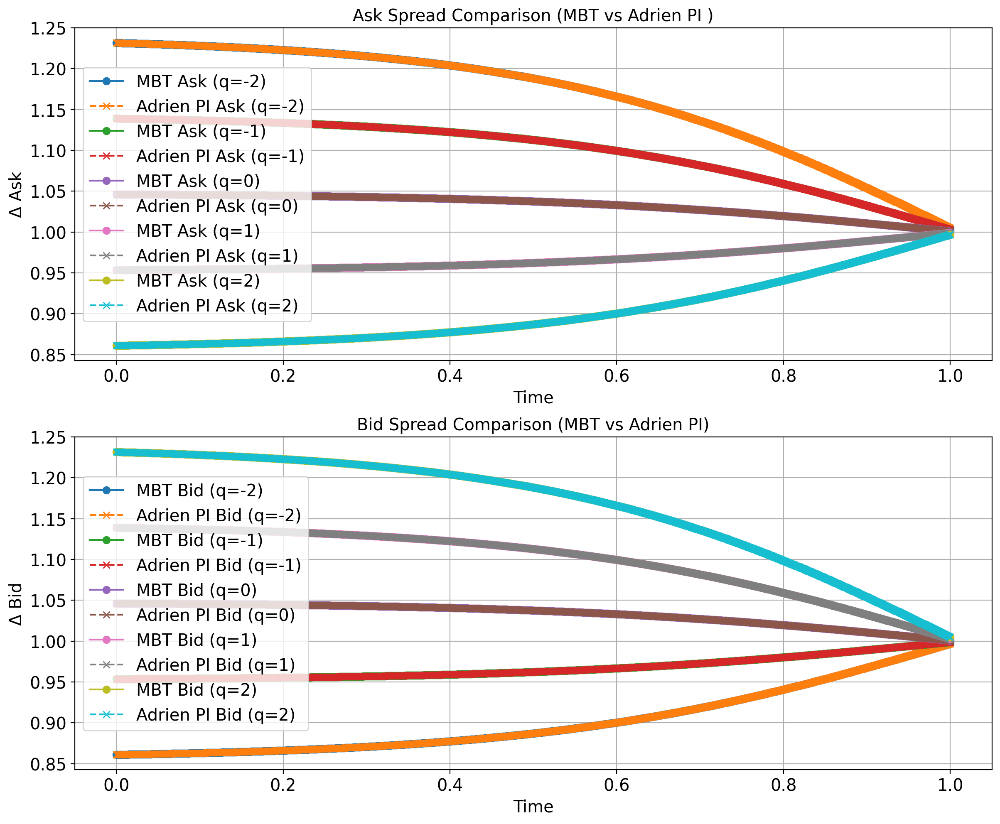

In [15]:
# Store values for plotting
times = []
q_values_all = []
mbt_asks = []
mbt_bids = []
adrien_PI_asks = []
adrien_PI_bids = []

print("-" * 60)
q_values = [-2, -1, 0, 1, 2]
#q_values = [2]
ii = 0
u=0

for t in np.linspace(0, env.terminal_time, env.n_steps):
    for q in q_values:
        # === MBT spreads ===
        print(f"t={t:.5f}, q={q}")
        mbt_bid, mbt_ask  = agent_mbt._get_spreads_aux(t, inventory=q, u=u, ii=ii)
        
        # === Adrien FI spreads ===
        # Assuming the new method returns (ask_FI, bid_FI, ask_PI, bid_PI)
        _, _, Adrien_PI_ask, Adrien_PI_bid = agent_Adrien.get_delta_fast(ii, q=q, u=u)

        # Store for plotting
        times.append(t)
        q_values_all.append(q)
        mbt_asks.append(mbt_ask)
        mbt_bids.append(mbt_bid)
        adrien_PI_asks.append(float(Adrien_PI_ask))
        adrien_PI_bids.append(float(Adrien_PI_bid))
    ii += 1


# === Plotting ===
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 10))

# --- Ask prices ---
plt.subplot(2, 1, 1)
for q in q_values:
    mask = [q_val == q for q_val in q_values_all]
    t_vals = [times[i] for i, m in enumerate(mask) if m]
    mbt_ask_vals = [mbt_asks[i] for i, m in enumerate(mask) if m]
    adrien_ask_vals = [adrien_PI_asks[i] for i, m in enumerate(mask) if m]
    
    plt.plot(t_vals, mbt_ask_vals, 'o-', label=f'MBT Ask (q={q})')
    plt.plot(t_vals, adrien_ask_vals, 'x--', label=f'Adrien PI Ask (q={q})')

plt.title('Ask Spread Comparison (MBT vs Adrien PI )')
plt.xlabel('Time')
plt.ylabel('Δ Ask')
plt.legend()
plt.grid(True)

# --- Bid prices ---
plt.subplot(2, 1, 2)
for q in q_values:
    mask = [q_val == q for q_val in q_values_all]
    t_vals = [times[i] for i, m in enumerate(mask) if m]
    mbt_bid_vals = [mbt_bids[i] for i, m in enumerate(mask) if m]
    adrien_bid_vals = [adrien_PI_bids[i] for i, m in enumerate(mask) if m]
    
    plt.plot(t_vals, mbt_bid_vals, 'o-', label=f'MBT Bid (q={q})')
    plt.plot(t_vals, adrien_bid_vals, 'x--', label=f'Adrien PI Bid (q={q})')

plt.title('Bid Spread Comparison (MBT vs Adrien PI)')
plt.xlabel('Time')
plt.ylabel('Δ Bid')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


In [16]:
t_test = env.terminal_time / 2
idx = int(np.argmin(np.abs(agent_Adrien.t_vector - t_test)))
t_eval = float(agent_Adrien.t_vector[idx])
print(f"Using t_eval≈{t_eval:.5f} (idx={idx}) closest to t_test={t_test:.5f}")

# Store values for plotting
times = []
q_values_all = []
u_values_all = []
mbt_asks = []
mbt_bids = []
adrien_PI_asks = []
adrien_PI_bids = []

print("-" * 60)
q_values = [-2, 0, 2]
ii = 0
u_values = [-0.5, 0, 0.5]

for t in np.linspace(0, env.terminal_time, env.n_steps):
    for q in q_values:
        for u in u_values:
            # === MBT spreads ===
            mbt_bid, mbt_ask  = agent_mbt._get_spreads_aux(t, inventory=q, u=u, ii=ii)
        
            # === Adrien PI spreads ===
            # Assuming the new method returns (ask_FI, bid_FI, ask_PI, bid_PI)
            Adrien_PI_ask, Adrien_PI_bid, _, _ = agent_Adrien.get_delta_fast(ii, q=q, u=u)

            # Store for plotting
            times.append(t)
            q_values_all.append(q)
            u_values_all.append(u)
            mbt_asks.append(mbt_ask)
            mbt_bids.append(mbt_bid)
            adrien_PI_asks.append(float(Adrien_PI_ask))
            adrien_PI_bids.append(float(Adrien_PI_bid))
    ii += 1


Using t_eval≈0.49950 (idx=499) closest to t_test=0.50000
------------------------------------------------------------
Current time: 0.0
MBT A, b0, b1, c0, c1, c2: -0.04633724864923867 0.0 -0.5473784112240065 21.250953657630358 0.0 -0.006640617439335365
MBT value_function_q: 20.516566097449566 value_function_q_pos: 20.929267049009283 value_function_q_neg: 20.011190648591366
Adien A, b0, b1, c0, c1, c2: -0.046337207691942495 0.0 -0.547378458359148 21.24007153959567 0.0 -0.006640973601499761
Adrien h, h_, h__: 20.50568400706838 20.91838485932378 20.00030873942909
Current time: 0.0
MBT A, b0, b1, c0, c1, c2: -0.04633724864923867 0.0 -0.5473784112240065 21.250953657630358 0.0 -0.006640617439335365
MBT value_function_q: 21.065604663033405 value_function_q_pos: 21.20461640898112 value_function_q_neg: 20.83391841978721
Adien A, b0, b1, c0, c1, c2: -0.046337207691942495 0.0 -0.547378458359148 21.24007153959567 0.0 -0.006640973601499761
Adrien h, h_, h__: 21.054722708827903 21.19373433190373 20.

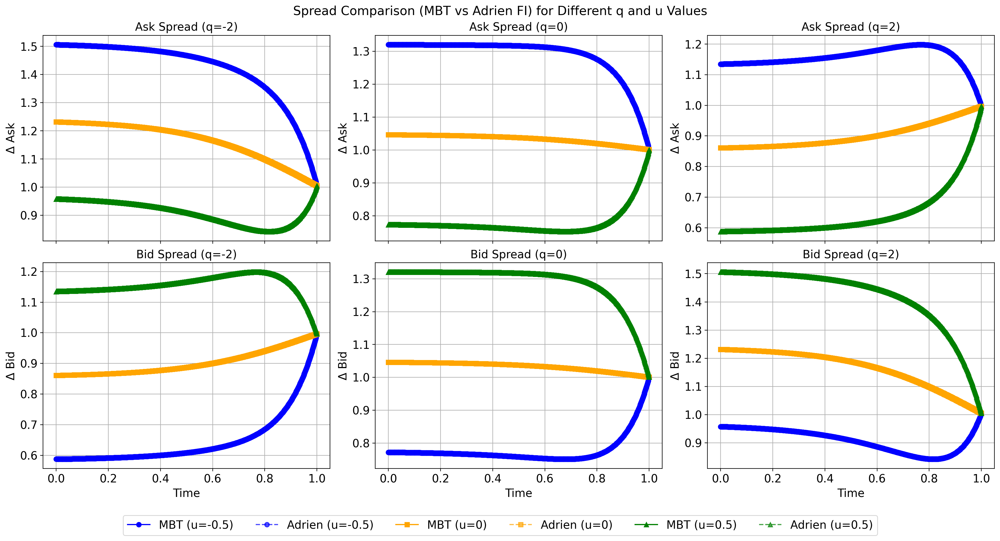

In [17]:
# === Plotting ===
import matplotlib.pyplot as plt

# Create a grid of subplots (2 rows for ask/bid, 3 columns for different q values)
fig, axes = plt.subplots(2, len(q_values), figsize=(18, 10), sharex=True)
fig.suptitle('Spread Comparison (MBT vs Adrien FI) for Different q and u Values', fontsize=16)

line_styles = ['-', '--', ':']
markers = ['o', 's', '^']
colors = ['blue', 'orange', 'green'] 

for i, q in enumerate(q_values):
    # --- Ask prices (top row) ---
    for j, u in enumerate(u_values):
        mask = [(q_val == q) & (u_val == u) for q_val, u_val in zip(q_values_all, u_values_all)]
        t_vals = [times[k] for k, m in enumerate(mask) if m]
        mbt_ask_vals = [mbt_asks[k] for k, m in enumerate(mask) if m]
        adrien_ask_vals = [adrien_PI_asks[k] for k, m in enumerate(mask) if m]
        
        axes[0, i].plot(t_vals, mbt_ask_vals, marker=markers[j], linestyle='-', 
                      color=colors[j], label=f'MBT (u={u})')
        axes[0, i].plot(t_vals, adrien_ask_vals, marker=markers[j], linestyle='--', 
                      color=colors[j], alpha=0.7, label=f'Adrien (u={u})')
    
    axes[0, i].set_title(f'Ask Spread (q={q})')
    axes[0, i].set_ylabel('Δ Ask')
    axes[0, i].grid(True)
    
    # --- Bid prices (bottom row) ---
    for j, u in enumerate(u_values):
        mask = [(q_val == q) & (u_val == u) for q_val, u_val in zip(q_values_all, u_values_all)]
        t_vals = [times[k] for k, m in enumerate(mask) if m]
        mbt_bid_vals = [mbt_bids[k] for k, m in enumerate(mask) if m]
        adrien_bid_vals = [adrien_PI_bids[k] for k, m in enumerate(mask) if m]
        
        axes[1, i].plot(t_vals, mbt_bid_vals, marker=markers[j], linestyle='-',
                      color=colors[j], label=f'MBT (u={u})')
        axes[1, i].plot(t_vals, adrien_bid_vals, marker=markers[j], linestyle='--',
                      color=colors[j], alpha=0.7, label=f'Adrien (u={u})')
    
    axes[1, i].set_title(f'Bid Spread (q={q})')
    axes[1, i].set_xlabel('Time')
    axes[1, i].set_ylabel('Δ Bid')
    axes[1, i].grid(True)

# Create a proper legend
handles, labels = [], []
for j, u in enumerate(u_values):
    # MBT line with solid linestyle
    handles.append(plt.Line2D([0], [0], marker=markers[j], linestyle='-', color=colors[j]))
    # Adrien line with dashed linestyle
    handles.append(plt.Line2D([0], [0], marker=markers[j], linestyle='--', color=colors[j], alpha=0.7))
    labels.extend([f'MBT (u={u})', f'Adrien (u={u})'])

fig.legend(handles, labels, loc='lower center', ncol=len(u_values)*2, bbox_to_anchor=(0.5, 0.02))

plt.tight_layout()
plt.subplots_adjust(bottom=0.15)  # Make space for the legend
plt.show()

### Analysis of coefficients

#### Adrien agent

In [18]:
mm_qconst = {'q0': mm, 'q1': mm, 'q2':mm,'q3':mm,'q4':mm,'q5':mm}
PnL_table_FI = []
PnL_table_PI = []
PnL_table_CJ = []

PnL_table_FI_q = []
PnL_table_PI_q = []
PnL_table_CJ_q = []

psi is  14.872343376978963
Adrien phi, varphi, psi, k, alpha 0.1 15 14.872343376978963 1 0.001
Adrien self.delta_t: 0.001
Adrien self.N_t: 1000


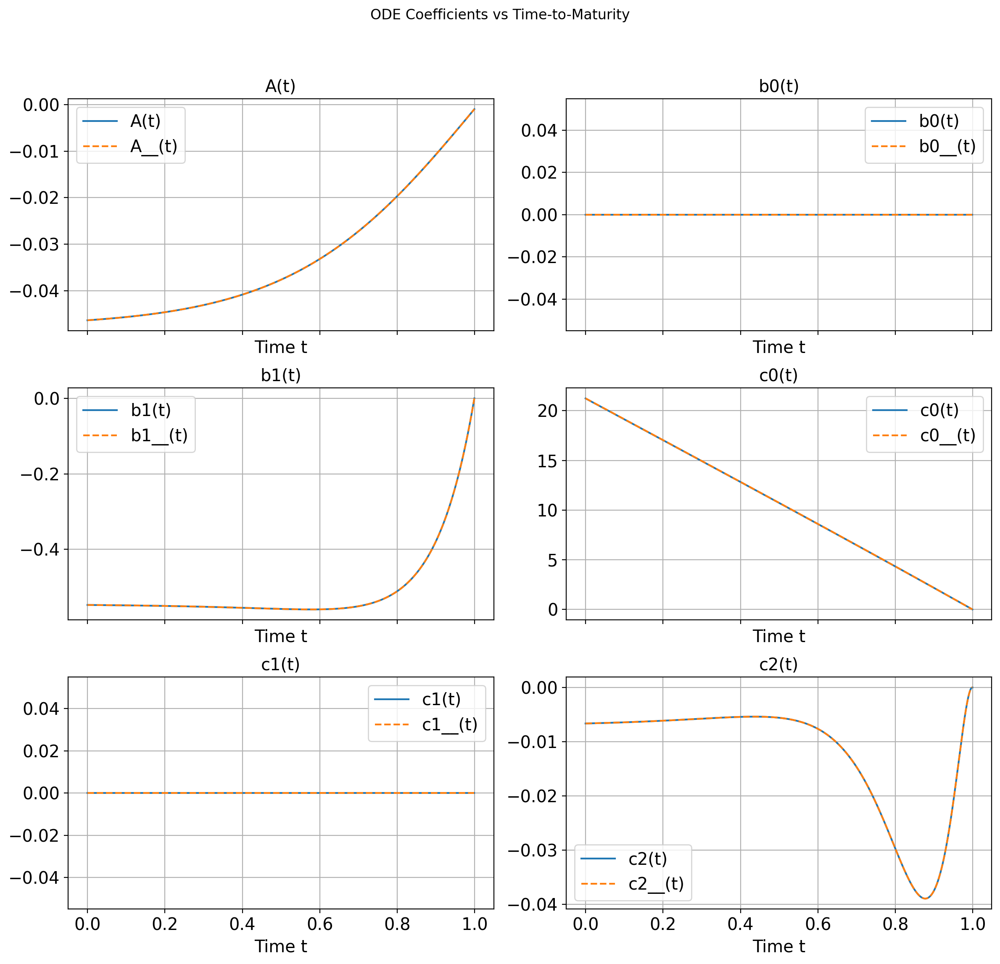

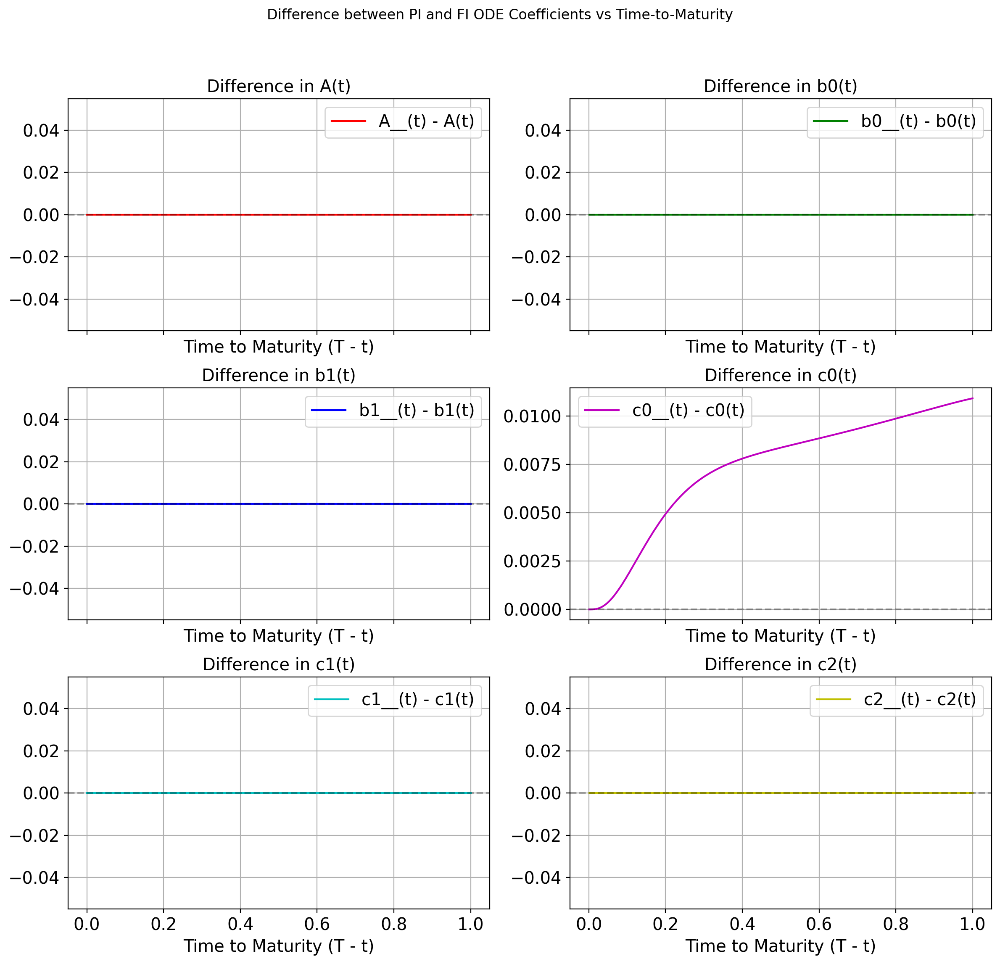

In [19]:
seed = 36457656
q_const_values = 0.6
params_env_cop = params_env.copy()
params_env_cop['N_t'] = 1000  # Number of time steps for the SB env
params_env_cop['matrixCJ'] = np.array(mm.get_delta_CJ_matrix())
for iq,const_value in enumerate([q_const_values]):
    params_aux = params_env_cop.copy()
    params_aux['qconst'] = const_value
    mm_aux = utils.mm_with_fads(**params_aux)
    mm_qconst[f'q{iq}'] = mm_aux
    mm_aux.plot_ODE_coefficients()
    mm_aux.plot_ODE_coefficient_differences()
    np.random.seed(seed)

#### mbt gym agent

In [20]:
env = get_as_env(fads_proportion=fads_proportion, psi=psi, phi=phi, eta=eta, gamma=gamma)
agent_mbt = OptimizedPartialInfoMMwithFadsInformedUniformedTradersAgent(env=env)

✓ Pre-computed ODE solutions for 1000 time points


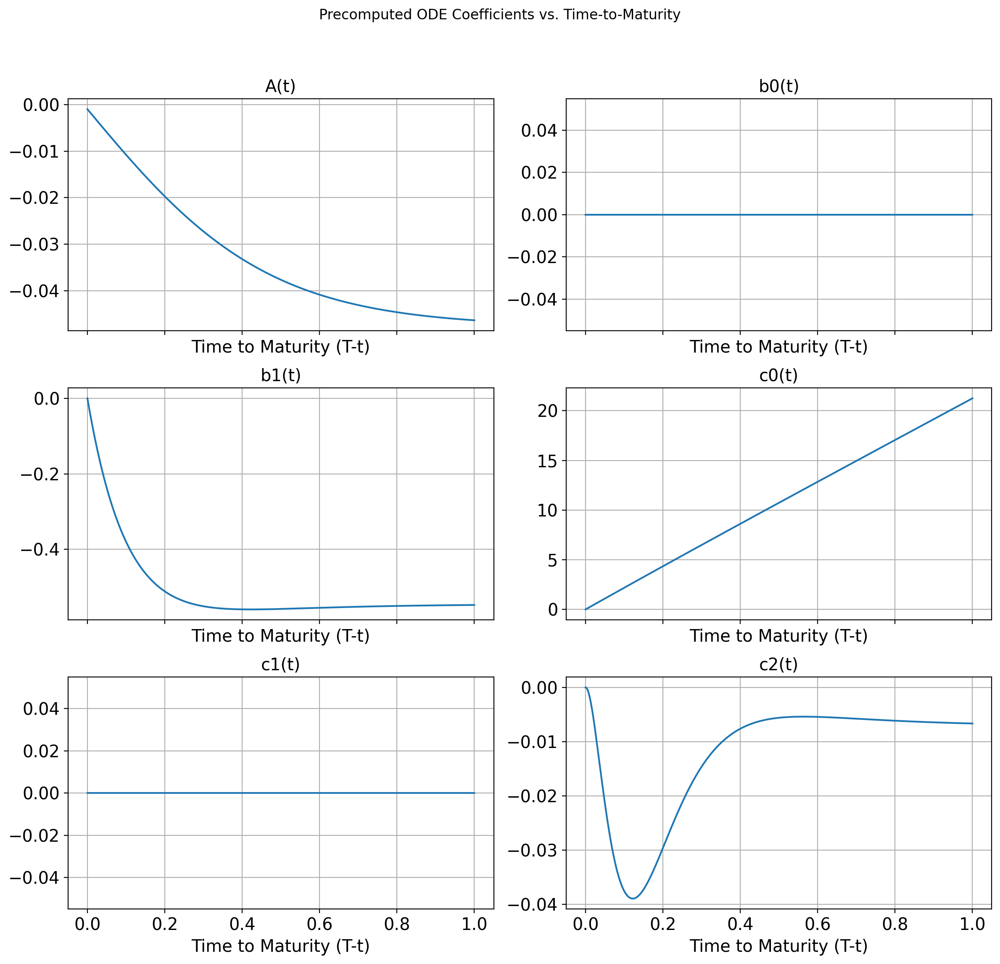

In [21]:
agent_mbt.plot_precomputed_solutions()

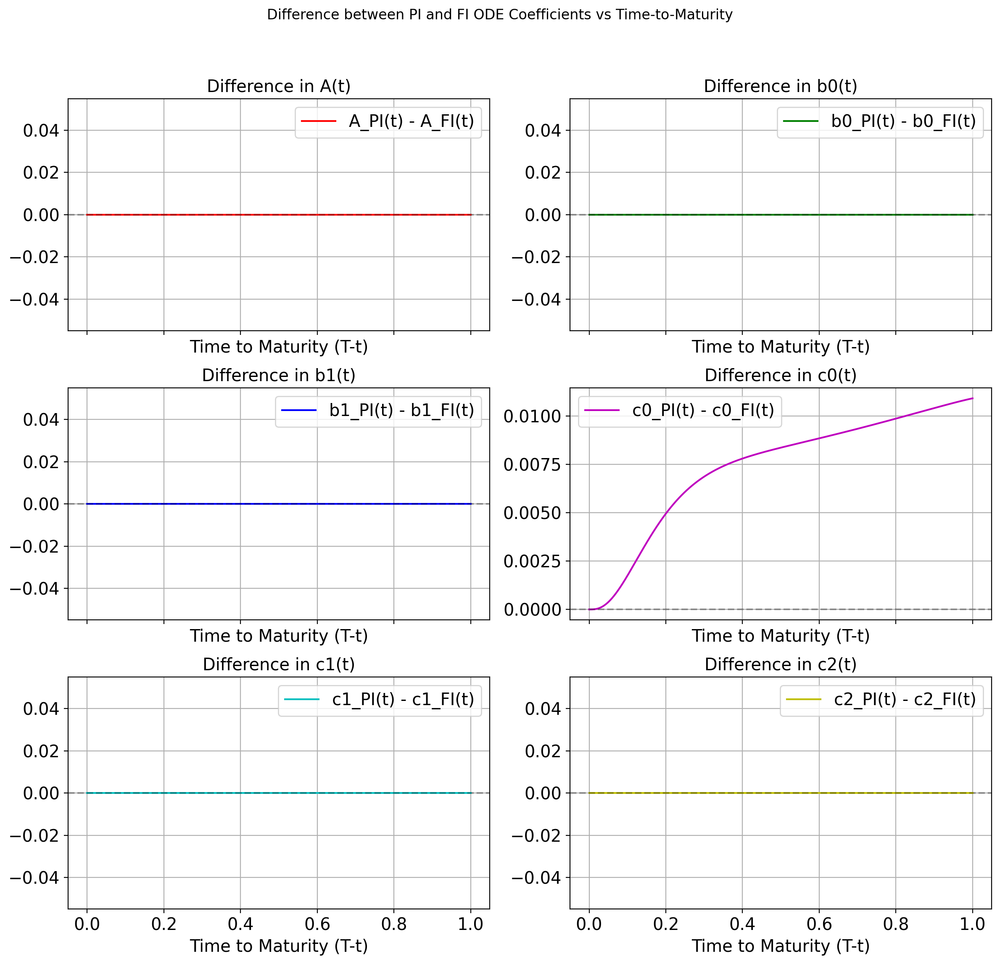

In [22]:
agent_mbt.plot_precomputed_coefficient_differences()